<div style="border:solid green 2px; padding: 20px">

Описание проекта.
    
Задача: подготовить исследование рынка точек общественного питания на территории Москвы, найти интересные особенности для выбора подходящего инвесторам места.
    
Описание датасета:
    
Таблица moscow_places.csv содержит информацию о организациях обещственного питания на территории г. Москва.
    
- `name` — название заведения;
- `category` — категория заведения;
- `address` — адрес заведения;
- `district` — административный район, в котором находится заведение;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах;
- `price` — категория цен в заведении;
- `avg_bill` — средняя стоимость чека в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека;
- `middle_coffee_cup` — число с оценкой одной чашки капучино;
- `chain` — принадлежность к сети;
- `seats` — количество посадочных мест;

### Знакомство с данными

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import folium
from plotly import graph_objects as go 
from collections import Counter
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
#уйдем от "научной нотации" для отображения числовых значений
pd.options.display.float_format = '{:.3f}'.format 

In [3]:
#загрузка датасета
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [4]:
# изучение общей информации
df.shape

(8406, 14)

In [5]:
# изучение общей информации
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
#общая информация о датасете
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000,8406.000,8406.000,3149.000,535.000,8406.000,4795.000
mean,55.750,37.609,4.230,958.054,174.721,0.381,108.422
std,0.070,0.099,0.470,1009.733,88.951,0.486,122.833
min,55.574,37.356,1.000,0.000,60.000,0.000,0.000
25%,55.705,37.539,4.100,375.000,124.500,0.000,40.000
50%,55.753,37.605,4.300,750.000,169.000,0.000,75.000
75%,55.795,37.665,4.400,1250.000,225.000,1.000,140.000
max,55.929,37.874,5.000,35000.000,1568.000,1.000,1288.000


In [7]:
#общая информация о датасете
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,NaN,0,4.000
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,NaN,0,45.000
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.882,37.489,5.000,NaN,Цена чашки капучино:155–185 ₽,NaN,170.000,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,NaN,1,148.000


In [8]:
#Определение столбцов с пропусками и кол-во этих пропусков/получение количества NaN элементов в записях
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

<b>Вывод:</b>
датасет вкл. 8406 строк и 14 столбцов с данными:
- 'name/название', тип:  оbject (строка) - менять не нужно
- 'category/категория', тип: object (строка)  - менять не нужно
- 'address/адрес', тип: object (строка)  - менять не нужно
- 'district/район', тип: object (строка)  - менять не нужно
- 'hours/информация о днях и часах работы', тип: object (строка)  - менять не нужно
- 'lat/широта географической точки', тип: float64 - менять не нужно
- 'lng/долгота географической точки', тип: float64 - менять не нужно
- 'rating/рейтинг', тип: float64 - менять не нужно
- 'price/категория цен', тип: object (строка)  - менять не нужно
- 'avg_bill/средняя сумма чека', тип: object (строка) - менять не нужно
- 'middle_avg_bill/число с оценкой среднего чека', тип: float64 - менять не нужно
- 'middle_coffee_cup/число с оценкой одной чашки капучино', тип: float64 - менять не нужно
- 'chain/принадлежность к сети', тип: int64  - менять не нужно 
- 'seats/количество посадочных мест', тип: float6 - менять не нужно4

При этом установлено, что есть пропуски в данных:
- 'hours/информация о днях и часах работы' - (кол-во пропусков/NAN 536) => заменить все пустые значения в 'hours/информация о днях и часах работы' на "не указано"
- 'price/категория цен' - (кол-во пропусков/NAN 5091) => заменить все пустые значения в 'price/категория цен' на "не указано"
- 'avg_bill/средняя сумма чека' - (кол-во пропусков/NAN 4590) => заменить все пустые значения в 'avg_bill/средняя сумма чека' на "не указано"
- 'middle_avg_bill/число с оценкой среднего чека' - (кол-во пропусков/NAN 5257)
- 'middle_coffee_cup/число с оценкой одной чашки капучино' - (кол-во пропусков/NAN 7871)
- 'seats/количество посадочных мест' - (кол-во пропусков/NAN 3611).

Также установлено, что есть аномально высокие значения в столбце 'seats/количество посадочных мест' - 1 288 мест

Гипотеза:
если точка общественного питания входит в сеть, то пропуски можно заменить значениями по сети

### Предобработка данных

In [9]:
#замена NaN значений на 0 в столбце df['seats']
df['seats'].fillna(0, inplace = True)
#замена NaN значений на 0 в столбце df['middle_avg_bill']
df['middle_avg_bill'].fillna(0, inplace = True)
#замена NaN значений на 0 в столбце df['middle_coffee_cup']
df['middle_coffee_cup'].fillna(0, inplace = True)

In [10]:
#замена NaN значений на 'не указано' в столбце df['hours']
df['hours'].fillna('не указано', inplace = True)

In [11]:
#замена NaN значений на 'не указано' в столбце df['price']
df['price'].fillna('не указано', inplace = True)

In [12]:
#замена NaN значений на 'не указано' в столбце df['avg_bill']
df['avg_bill'].fillna('не указано', inplace = True)

In [13]:
#изучим уникальные значения df['name']
df['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Шаурма Z              1
Бакинский рай         1
Дрова и Угли          1
Хлебомания            1
Easy Brix             1
Name: name, Length: 5614, dtype: int64

In [14]:
#отобрать строки с записями о точках общепита, что входят в сеть
df.loc[df['chain'] == 1]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,0.000,1,148.000
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877,37.505,4.800,не указано,не указано,0.000,0.000,1,180.000
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.888,37.516,4.400,не указано,не указано,0.000,0.000,1,0.000
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880,37.449,4.300,не указано,не указано,0.000,0.000,1,148.000
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888,37.527,4.700,не указано,не указано,0.000,0.000,1,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.691,37.788,4.100,не указано,не указано,0.000,0.000,1,0.000
8340,Семейный Очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688,37.725,4.300,средние,Средний счёт:до 1000 ₽,1000.000,0.000,1,98.000
8372,Чайхана Sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716,37.813,3.900,средние,Средний счёт:150–350 ₽,250.000,0.000,1,32.000
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.679,37.759,4.300,не указано,не указано,0.000,0.000,1,40.000


для нагляности посмотрим 2 сети: Чайхана Sabr и Додо Пицца

In [15]:
df.loc[df['name'] == 'Чайхана Sabr']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8372,Чайхана Sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716,37.813,3.900,средние,Средний счёт:150–350 ₽,250.000,0.000,1,32.000
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.649,37.743,4.200,не указано,не указано,0.000,0.000,1,150.000


In [16]:
df.loc[df['name'] == 'Додо Пицца']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877,37.523,4.300,не указано,Средний счёт:328 ₽,328.000,0.000,1,46.000
95,Додо Пицца,пиццерия,"Москва, Дубнинская улица, 50",Северный административный округ,"ежедневно, 09:00–23:00",55.894,37.559,4.300,не указано,Средний счёт:349 ₽,349.000,0.000,1,50.000
119,Додо Пицца,пиццерия,"Москва, Алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–23:00",55.888,37.588,4.300,не указано,Средний счёт:355 ₽,355.000,0.000,1,120.000
256,Додо Пицца,пиццерия,"Москва, Широкая улица, 27",Северо-Восточный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–23:00",55.888,37.676,4.300,не указано,Средний счёт:362 ₽,362.000,0.000,1,15.000
275,Додо Пицца,пиццерия,"Москва, улица Лескова, 19А, стр. 2",Северо-Восточный административный округ,"ежедневно, 09:00–00:00",55.894,37.617,4.200,не указано,Средний счёт:291 ₽,291.000,0.000,1,110.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7819,Додо Пицца,пиццерия,"Москва, Бирюлёвская улица, 51",Южный административный округ,"ежедневно, 09:00–22:00",55.583,37.671,4.500,не указано,Средний счёт:372 ₽,372.000,0.000,1,0.000
7883,Додо Пицца,пиццерия,"Москва, Воронежская улица, 36, корп. 1",Южный административный округ,"ежедневно, 10:00–22:30",55.610,37.740,4.300,не указано,Средний счёт:340 ₽,340.000,0.000,1,8.000
7904,Додо Пицца,пиццерия,"Москва, Каширское шоссе, 65, корп. 3",Южный административный округ,"ежедневно, 10:00–22:30",55.599,37.725,4.400,не указано,Средний счёт:475 ₽,475.000,0.000,1,160.000
7934,Додо Пицца,пиццерия,"Москва, Домодедовская улица, 42А",Южный административный округ,"ежедневно, 10:00–22:30",55.603,37.714,4.300,не указано,Средний счёт:432 ₽,432.000,0.000,1,9.000


<b>Вывод:</b> можно заменить отсутствующие значения по столбцу 'price/категория цен'

In [17]:
#замена через цикл for
for name in df.loc[(df['chain'] == 1) & (df['price'].isna()), 'name'].unique():
    # выбираем только строчки с сетью name и создаем копию датасета
    df_chain = df.loc[df['name'] == name].copy()
    if sum(df_chain['price'].isna()) and sum(df_chain['price'].notna()):
        variants = df_chain.loc[df_chain['price'].notna(), 'price']
        most_common_price = Counter(variants).most_common(1)[0][0]
        df.loc[(df['name'] == name) & (df['price'].isna()), 'price'] = most_common_price

In [18]:
#проверка
df.loc[df['name'] == 'Додо Пицца']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877,37.523,4.300,не указано,Средний счёт:328 ₽,328.000,0.000,1,46.000
95,Додо Пицца,пиццерия,"Москва, Дубнинская улица, 50",Северный административный округ,"ежедневно, 09:00–23:00",55.894,37.559,4.300,не указано,Средний счёт:349 ₽,349.000,0.000,1,50.000
119,Додо Пицца,пиццерия,"Москва, Алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–23:00",55.888,37.588,4.300,не указано,Средний счёт:355 ₽,355.000,0.000,1,120.000
256,Додо Пицца,пиццерия,"Москва, Широкая улица, 27",Северо-Восточный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–23:00",55.888,37.676,4.300,не указано,Средний счёт:362 ₽,362.000,0.000,1,15.000
275,Додо Пицца,пиццерия,"Москва, улица Лескова, 19А, стр. 2",Северо-Восточный административный округ,"ежедневно, 09:00–00:00",55.894,37.617,4.200,не указано,Средний счёт:291 ₽,291.000,0.000,1,110.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7819,Додо Пицца,пиццерия,"Москва, Бирюлёвская улица, 51",Южный административный округ,"ежедневно, 09:00–22:00",55.583,37.671,4.500,не указано,Средний счёт:372 ₽,372.000,0.000,1,0.000
7883,Додо Пицца,пиццерия,"Москва, Воронежская улица, 36, корп. 1",Южный административный округ,"ежедневно, 10:00–22:30",55.610,37.740,4.300,не указано,Средний счёт:340 ₽,340.000,0.000,1,8.000
7904,Додо Пицца,пиццерия,"Москва, Каширское шоссе, 65, корп. 3",Южный административный округ,"ежедневно, 10:00–22:30",55.599,37.725,4.400,не указано,Средний счёт:475 ₽,475.000,0.000,1,160.000
7934,Додо Пицца,пиццерия,"Москва, Домодедовская улица, 42А",Южный административный округ,"ежедневно, 10:00–22:30",55.603,37.714,4.300,не указано,Средний счёт:432 ₽,432.000,0.000,1,9.000


In [19]:
#проверка
df.isnull().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

In [20]:
#проверка наличия дубликатов
duplicate = df[df.duplicated(keep = 'last')]

<b>Вывод:</b> в датафрейме не найдено явных дубликатов. Нужно посмотреть на наличие технических ошибок, опечаток и т.д.
Возможные причины появления дубликатов: технические ошибки, человеческий фактор.
Так как в датасете предствлены сетевые заведения, то данные о них могут полностью совпадать (название, часы работы и т.д.). Также по одному адресу могут находить несколько заведений - тут тоже допустимы совпадения.

Можно обработать распространенные опечатки е/ё, удалить лишние пропуски (пропуски после названий, например)

In [21]:
#цикл для замены е на ё
for col in ['name', 'address', 'district']:
    df[col] = df[col].str.replace('ё', 'е')

In [22]:
#цикл дабы убрать возможные лишние побелы в начале и в конце
for col in ['name', 'address', 'district']:
    df[col] = df[col].str.strip()

In [23]:
#изучение столбца name
df['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Кутята                1
Christopher. Co       1
Pinch                 1
Нават                 1
Easy Brix             1
Name: name, Length: 5608, dtype: int64

In [24]:
#изучение столбца seats
df['seats'].value_counts()

0.000      3747
40.000      253
100.000     213
60.000      175
50.000      168
           ... 
600.000       1
268.000       1
61.000        1
236.000       1
33.000        1
Name: seats, Length: 229, dtype: int64

In [25]:
#изучение столбца seats
df['seats'].describe()

count   8406.000
mean      61.847
std      107.176
min        0.000
25%        0.000
50%       20.000
75%       85.000
max     1288.000
Name: seats, dtype: float64

In [26]:
#изучение столбца category
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [27]:
#изучение столбца district
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Есть данные по след. административным районам Москвы:

    * Центральный административный округ (2242 ед.)
    * Северный административный округ (900 ед.)
    * Южный административный округ (892 ед.)
    * Северо-Восточный административный округ (891 ед.)
    * Западный административный округ (851 ед.)
    * Восточный административный округ (798 ед.)
    * Юго-Восточный административный округ (714 ед.)
    * Юго-Западный административный округ (709 ед.)
    * Северо-Западный административный округ (409 ед.)

<b>Вывод: </b> больше всего заведений общественого питания в центральном округе

In [28]:
# строим столбчатую диаграмму 
fig = px.bar(x = df['district'].value_counts(ascending=True).values, # указываем столбец с данными для оси X
             y = df['district'].value_counts(ascending=True).index, # указываем столбец с данными для оси Y
             text = df['district'].value_counts(ascending=True).values # добавляем аргумент, который отобразит текст с информацией
                                # о количестве заведений общественного питания
            )
# оформляем график
fig.update_layout(title='Распределение заведений общественного питания по округа г. Москвы',
                   xaxis_title='Количество заведений общественного питания',
                   yaxis_title=' ')
fig.show() # выводим график

<b>Вывод:</b> Заметно резкое уменьшение по Северо-Западному административному округу - требуется доп.исследование причин

In [29]:
#изучение столбца hours
df['hours'].value_counts()

ежедневно, 10:00–22:00                                               759
ежедневно, круглосуточно                                             730
не указано                                                           536
ежедневно, 11:00–23:00                                               396
ежедневно, 10:00–23:00                                               310
                                                                    ... 
пн-чт 12:00–00:00; пт 12:00–03:00; сб,вс 12:00–00:00                   1
пн-чт 12:00–03:00; пт,сб 12:00–04:30; вс 12:00–03:00                   1
пн-чт 09:00–16:00; пт 09:00–15:30                                      1
пн-чт 12:00–00:00; пт 12:00–01:00; сб 13:00–01:00; вс 13:00–00:00      1
пн 10:00–20:00                                                         1
Name: hours, Length: 1308, dtype: int64

<b>Вывод:</b> наиболее распростаненный временой инервал с 10:00 до 22:00; превалирующеее большинство работает ежедневно

In [30]:
#проверим, что во всех адресах 0й элемент - Москва
df['address'].str.split(',').str[0].unique()

array(['Москва'], dtype=object)

In [31]:
#создание столбеца street с названиями улиц из столбца с адресом
df['street'] = df['address'].str.split(',').str[1]

In [32]:
#функция для категоризации 
def categorize(hours):
    if 'ежедневно, круглосуточно' in hours:
        return 'True'
    return 'False'

In [33]:
#создание столбеца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
df['is_24/7'] = df['hours'].apply(categorize)

In [34]:
#проверка 
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,не указано,не указано,0.000,0.000,0,0.000,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,0.000,0,4.000,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,0.000,0,45.000,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.882,37.489,5.000,не указано,Цена чашки капучино:155–185 ₽,0.000,170.000,0,0.000,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,0.000,1,148.000,Правобережная улица,False


### Анализ данных. 

#### Изучение категорий заведений. 

In [35]:
#визуализация распределения заведений по категориям
# строим столбчатую диаграмму 
fig = px.bar(x = df['category'].value_counts(ascending=True).values, # указываем столбец с данными для оси X
             y = df['category'].value_counts(ascending=True).index, # указываем столбец с данными для оси Y
             text = df['category'].value_counts(ascending=True).values # добавляем аргумент, который отобразит текст с информацией
                                # о количестве по категориям
            )
# оформляем график
fig.update_layout(title='Распределение заведений общественного питания по категориям',
                   xaxis_title='Количество заведений общественного питания',
                   yaxis_title='Категория')#так как очевидно, что по оси указаны категории, то нет смысла подписывать и утяжелять график
fig.show() # выводим график

<b>Вывод:</b> в датасете представлены 8 категорий заведений общественного питания; чаще всего открывают "Кафе" (2 378 ед), "рестораны" (2 043 ед), "кофейни" (1 413 ед)

In [36]:
# посмотрим средние данные по категориям заведений общественного питания, вкл.кол-во посадочных мест
df.groupby(['category']).agg('mean')

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
category,,,,,,,
"бар,паб",55.755,37.612,4.388,610.756,1.634,0.221,76.184
булочная,55.756,37.592,4.268,136.387,0.000,0.613,51.676
быстрое питание,55.748,37.617,4.050,175.201,0.232,0.385,57.235
кафе,55.746,37.615,4.124,206.552,0.177,0.328,49.945
кофейня,55.756,37.600,4.277,86.937,64.546,0.510,59.102
пиццерия,55.748,37.611,4.301,492.581,0.727,0.521,63.744
ресторан,55.748,37.604,4.290,696.327,0.000,0.357,75.805
столовая,55.758,37.616,4.211,192.692,0.000,0.279,51.933


In [37]:
#сводная табл для изучения распределения посадочных мест по категориям объектов общественного питания
pd.pivot_table(df,
           index=['category'],
           values=['seats'])

,seats
category,
"бар,паб",76.184
булочная,51.676
быстрое питание,57.235
кафе,49.945
кофейня,59.102
пиццерия,63.744
ресторан,75.805
столовая,51.933


In [38]:
df.groupby('category', as_index=False)['rating'].agg('median')

,category,rating
0,"бар,паб",4.400
1,булочная,4.300
2,быстрое питание,4.200
3,кафе,4.200
4,кофейня,4.300
5,пиццерия,4.300
6,ресторан,4.300
7,столовая,4.300


<b>Выводы:</b> 
* в среднем во всех представленных типах заведений общественного питания более 40 посадочных мест;
* самый высокий рейтинг (в среднем) у баров, далее пиццерии, ресторан, кофейня;

#### Изучение посадочных мест. 

In [39]:
#ранее установлено,что есть аномально высокие значения в данном столбце
df.loc[(df['seats'] == 1288.0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.653,37.476,4.100,высокие,Средний счёт:1500–2000 ₽,1750.000,0.000,0,1288.000,проспект Вернадского,True
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657,37.482,4.500,выше среднего,Средний счёт:1500 ₽,1500.000,0.000,1,1288.000,проспект Вернадского,False
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.668,37.491,4.800,не указано,не указано,0.000,0.000,1,1288.000,проспект Вернадского,False
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665,37.479,4.300,не указано,не указано,0.000,0.000,1,1288.000,проспект Вернадского,False
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667,37.491,4.100,средние,Средний счёт:700 ₽,700.000,0.000,0,1288.000,проспект Вернадского,False
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,не указано,55.657,37.482,4.500,не указано,не указано,0.000,0.000,0,1288.000,проспект Вернадского,False
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,не указано,55.657,37.482,4.400,не указано,не указано,0.000,0.000,1,1288.000,проспект Вернадского,False
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,не указано,55.666,37.478,4.700,не указано,не указано,0.000,0.000,1,1288.000,проспект Вернадского,False
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665,37.479,3.600,не указано,не указано,0.000,0.000,0,1288.000,проспект Вернадского,False
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.673,37.508,4.000,не указано,не указано,0.000,0.000,1,1288.000,проспект Вернадского,True


<b>Вывод:</b> имеется недостоверная информация в датасете, так как не может столько заведений с кол-вом посадочных мест 1 288, то есть достаточно большой площадью (зал + кухня + подсобные помещения), располагаться по сути дела по нескольким адресам.
Например кафе "Точка" по адресу Москва, проспект Вернадского, 84, стр. 1 - Кафе на фудкорте Академии.

Возможно: ошибка выгрузки?

In [40]:
#изучение столбца address
df['address'].value_counts()

Москва, проспект Вернадского, 86В                      28
Москва, Усачева улица, 26                              26
Москва, Ярцевская улица, 19                            20
Москва, площадь Киевского Вокзала, 2                   20
Москва, Лесная улица, 20, стр. 3                       16
                                                       ..
Москва, улица Василия Петушкова, 3, корп. 3, стр. 1     1
Москва, Нагатинская улица, 25, стр. 1                   1
Москва, улица Крымский Вал, 9с21                        1
Москва, Ходынский бульвар, 11А                          1
Москва, Стартовая улица, 9, корп. 2                     1
Name: address, Length: 5753, dtype: int64

поиск по интернету показал, что:
* Москва, проспект Вернадского, 86В - парк фудхолл
* Москва, Усачева улица, 26 - усачевский рынок 
* Москва, Ярцевская улица, 19 - ТРЦ "Кунцево плаза"

<b>Вывод:</b> в датасете представлены также ТРЦ, где может быть большое кол-во точек общественного питания. Тогда вероятно кол-во посадочных мест указано суммарно, на всю зону фудкорта.
В этом случае эти данные, вероятно, не следует брать в расчет, либо следует рассматривать отдельно, так как цели "открытие заведения общественного питания на территории ТРЦ" и "открытие заведения общественного питания на территории Москвы в общем" несколько различаются (разная аудитория, затраты на вложение, накладные расходы).

Так как цель: открытие кофейни аналогичной "Центральной кофейне в сераиле Друзья", то расположенные на территории ТРЦ кофейни можно не учитывать

In [41]:
# создадим вспомогательный датафрейм "без ТРЦ": установим ограничение по кол-ву мест
data = df.loc[(df['seats'] < 150)]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878,37.479,5.000,не указано,не указано,0.000,0.000,0,0.000,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.876,37.484,4.500,выше среднего,Средний счёт:1500–1600 ₽,1550.000,0.000,0,4.000,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889,37.526,4.600,средние,Средний счёт:от 1000 ₽,1000.000,0.000,0,45.000,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.882,37.489,5.000,не указано,Цена чашки капучино:155–185 ₽,0.000,170.000,0,0.000,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881,37.449,5.000,средние,Средний счёт:400–600 ₽,500.000,0.000,1,148.000,Правобережная улица,False


In [42]:
# описание созданного всмпомогательного датасета
data['seats'].describe()

count   7274.000
mean      29.647
std       38.997
min        0.000
25%        0.000
50%        0.000
75%       50.000
max      148.000
Name: seats, dtype: float64

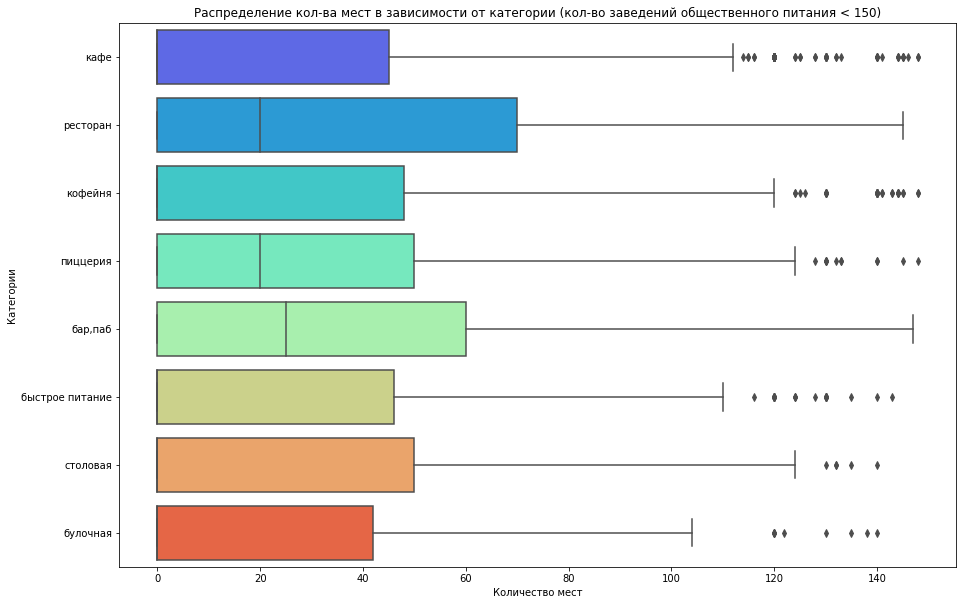

In [43]:
# визуализация Распределение кол-ва мест в зависимости от категории заведения общественного 
#питания (кол-во заведений общественного питания < 150)
plt.figure(figsize = (15,10))
sns.boxplot(x='seats', y='category', data=data, palette='rainbow'); 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение кол-ва мест в зависимости от категории (кол-во заведений общественного питания < 150)')
plt.xlabel('Количество мест')
plt.ylabel('Категории')
# отображаем график на экране
plt.show()

<b>Вывод:</b>
всего в датасете 8406, при это заведений с кол-вом посадочных мест < 150 = 7274
то есть % записей с информацией о заведениях общественного питания на территории ТРЦ порядка 13,5 %

По-хорошему, нужно уточнить у Заказчика следует ли разделить/сегментировать исследование, так как с точки зрения бизнеса, все же, открытие заведения общественного питания "в ТРЦ" и "вне ТРЦ" отличаются.

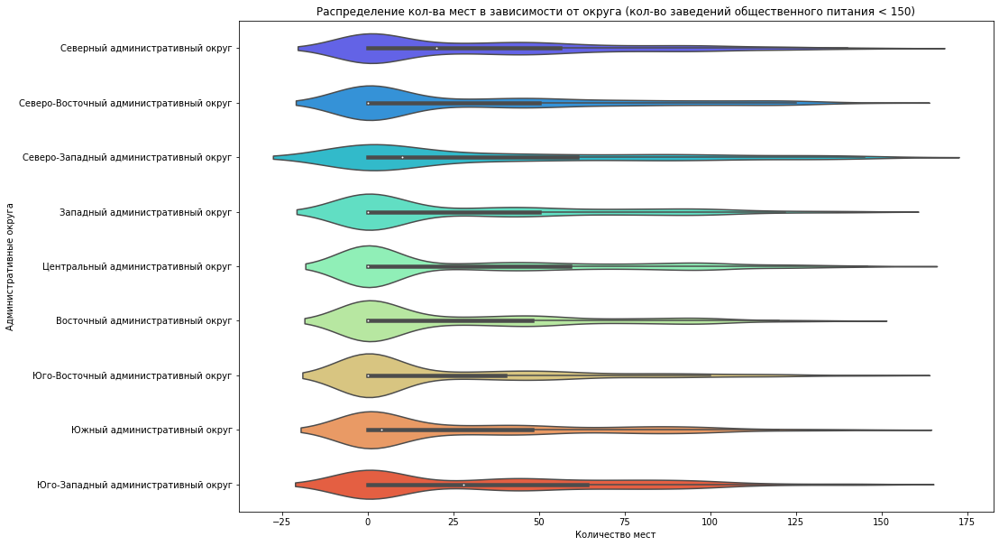

In [44]:
#визуализация Распределение кол-ва мест в зависимости от округа (кол-во заведений общественного питания < 150)
plt.figure(figsize = (15,10))
sns.violinplot(x='seats', y='district', data=data, palette='rainbow'); 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение кол-ва мест в зависимости от округа (кол-во заведений общественного питания < 150)')
plt.xlabel('Количество мест')
plt.ylabel('Административные округа')
# отображаем график на экране
plt.show()

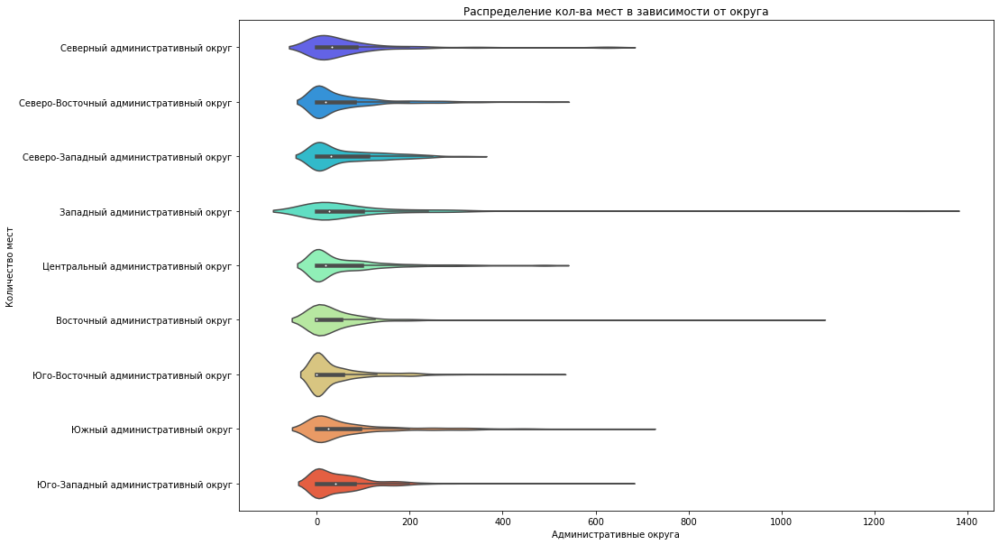

In [45]:
#визуализация Распределение кол-ва мест в зависимости от округа (по исходному датасету)
plt.figure(figsize = (15,10))
sns.violinplot(x='seats', y='district', data=df, palette='rainbow'); 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение кол-ва мест в зависимости от округа')
plt.xlabel('Административные округа')
plt.ylabel('Количество мест')
# отображаем график на экране
plt.show()

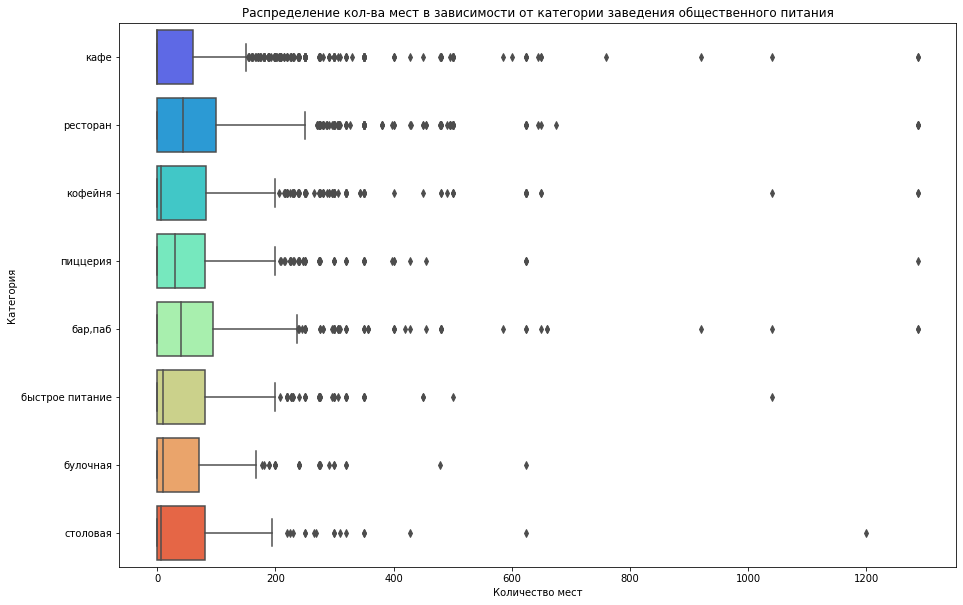

In [46]:
# визуализация Распределение кол-ва мест в зависимости от категории заведения общественного питания (по исходному датасету)
plt.figure(figsize = (15,10))
sns.boxplot(x='seats', y='category', data=df, palette='rainbow'); 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение кол-ва мест в зависимости от категории заведения общественного питания')
plt.xlabel('Количество мест')
plt.ylabel('Категория')
# отображаем график на экране
plt.show()

#### Соотношение сетевых и несетевых заведений общественного питания. 

In [47]:
#определим соотношение сетевых и несетевых заведений общественного питания
df['chain'].value_counts(normalize=True) * 100

0   61.872
1   38.128
Name: chain, dtype: float64

In [48]:
#визуализация
name_rest = ['Несетевые заведения общественного питания', 'Сетевые заведения общественного питания']
values = [61.87, 38.12]

fig = go.Figure(data=[go.Pie(labels=name_rest, values=values, title = 'Доля сетевых и несетевых заведений общественного питания')]) 

fig.show()

<b>Вывод:</b> в датасете представлено больше несетевых заведений

#### Исследование категорий сетевых заведений

In [49]:
# отфильтруем данные, сгруппируем по названию и посчитаем названия
df_loc_name = df.loc[df['chain'] == 1].groupby('name')[['name']].count()
# переименуем столбец
df_loc_name.columns = ['total_count']
# отсортируем и оставим пятнадцать лидеров
df_loc_name = df_loc_name.reset_index().sort_values(by='total_count', ascending=False).head(15)
display(df_loc_name)

,name,total_count
745,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
758,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
678,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [50]:
# строим столбчатую диаграмму 
fig = px.bar(df_loc_name.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией о количестве
                                
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетевых заведений общественного питания',
                   xaxis_title='Количество объявлений',
                   yaxis_title='Названия заведений общественного питания') #так как очевидно, что по оси указаны категории, то нет смысла подписывать и утяжелять график
fig.show() # выводим график

<b>Вывод:</b>
* Все указанные сети известны и реальны;
* Данные сети не являются ресторанами, скорее относятся с среднему ценовому сегменту (часть из них вообще предполагает возможность купить кофе и еду "навынос": One Price Coffe, Cofix, Додо Пицца, Prime)
* К какой категории заведений они относятся: кофейня, булочная, ресторан, быстрое питание, кафе, пиццерия, столовая, бар/паб 

#### Распределение заведений общественного питания по районам Москвы

In [51]:
#визуализация распределения заведений общественного питания по районам Москвы
#создание вспомогательного датасета
df_district = df['district'].value_counts()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_district,
    columns=['district'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m)

# выводим карту
m

In [52]:
#создание вспомогательного датасетаа
df_category = df.pivot_table(values=['name'], index=['category'], columns=['district'], aggfunc='count')['name']
display(df_category)

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",53,50,68,63,23,364,38,38,68
булочная,25,37,39,28,12,50,13,27,25
быстрое питание,71,62,58,82,30,87,67,61,85
кафе,272,239,235,269,115,464,282,238,264
кофейня,105,150,193,159,62,428,89,96,131
пиццерия,72,71,77,68,40,113,55,64,73
ресторан,160,218,189,182,109,670,145,168,202
столовая,40,24,41,40,18,66,25,17,44


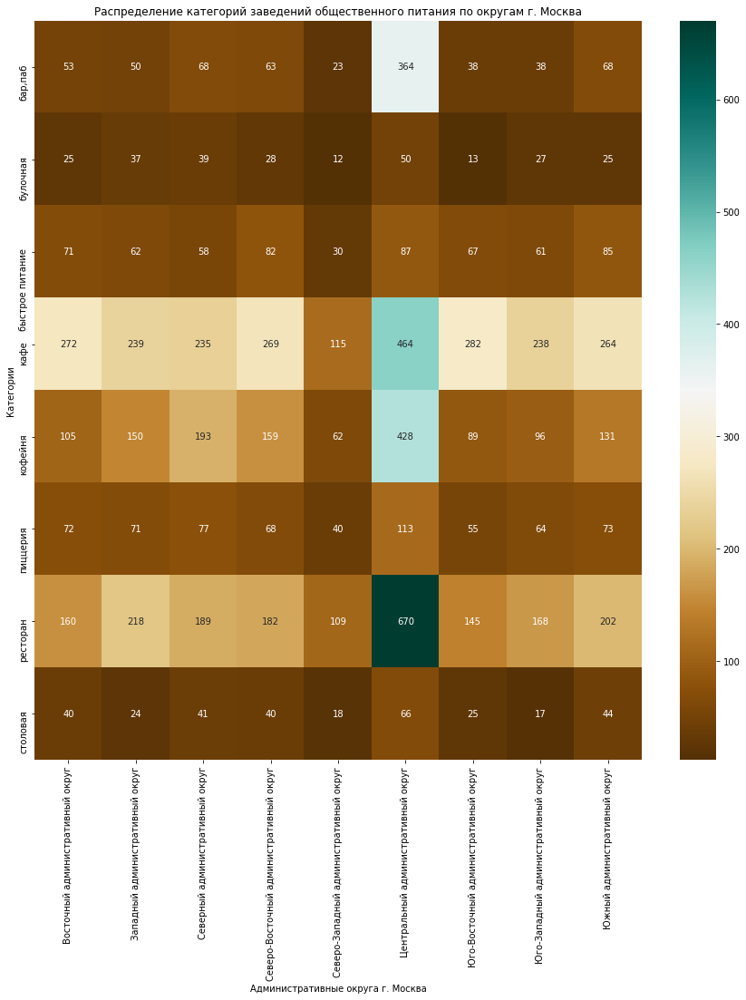

In [53]:
plt.figure(figsize = (15,15))
sns.heatmap(df_category, cmap="BrBG", annot= True, fmt='g');
# подписи осей
plt.xlabel('Административные округа г. Москва')
plt.ylabel('Категории')
plt.title('Распределение категорий заведений общественного питания по округам г. Москва');

<b>Вывод:</b> в центральном округе больше всего ресторанов (670 шт) и кафе (464 шт). Кафе во всех регионах лежат в дианопозе от 200 до 500. Также можно заметить, что больше всего пабов именно в центральном районе.

In [54]:
#создание вспомогстельного датасета
z = df.pivot_table(values='name', index=['district'], columns=['category'], aggfunc='count').\
sort_values(by = 'district', ascending=True)
display(z)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [55]:
# упорядочим вспомогательный датасет
z = z.loc[z.sum(axis = 1).sort_values().index]

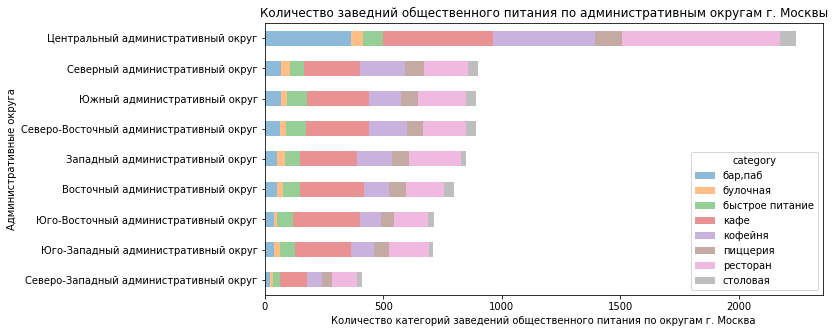

In [56]:
#диаграмма распределения категорий заведений общественного питания по окгругам г. Москва

z.plot.barh(stacked=True, alpha=0.5, figsize = (10, 5));

# подписи осей
plt.xlabel('Количество категорий заведений общественного питания по округам г. Москва')
plt.ylabel('Административные округа')#так как очевидно, что по оси указаны категории, то нет смысла подписывать и утяжелять график
plt.title('Количество заведний общественного питания по административным округам г. Москвы');

#### Распределение средних рейтингов по категориям заведений

In [57]:
#создадим вспомогательный датасет
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')

In [58]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<b>Вывод:</b> самые рейтинговые заведения расположены в центральном округе

In [59]:
#посмотрим средний рейтинг по категориям заведений
#создадим вспомогательный датасет
df_rating = df.groupby('category', as_index=False)['rating'].agg('median').sort_values(by = 'rating', ascending = False)
#df_rating.columns = ['total_count']
display(df_rating)

,category,rating
0,"бар,паб",4.400
1,булочная,4.300
4,кофейня,4.300
5,пиццерия,4.300
6,ресторан,4.300
7,столовая,4.300
2,быстрое питание,4.200
3,кафе,4.200


In [60]:
#визуализация распределения среднего рейтинга по категориям заведений
# строим столбчатую диаграмму 
fig = px.bar(x = df_rating['category'], # указываем столбец с данными для оси X
             y = df_rating['rating'], # указываем столбец с данными для оси Y
             text = df_rating['rating'] # добавляем аргумент, который отобразит текст с информацией о значении рейтинга
                  
            )
# оформляем график
fig.update_layout(title='Распределение среднего рейтинга по категориям заведений',
                   xaxis_title='Категория заведений общественного питания',#так как очевидно, что по оси указаны категории, то нет смысла подписывать и утяжелять график
                   yaxis_title='Рейтинг')
fig.show() # выводим график

<b>Вывод:</b> средние рейтинги заведений сильно не различаются, самые высокие рейтинги у баров/пабов

In [61]:
# создаём категории для округов, где расположены заведения общественного питания
df['locality_name_category'] = 'Другое'
df.loc[df['district'] == 'Центральный административный округ', 'locality_name_category'] = 'Центральный административный округ'

In [62]:
#визуализация распределения рейтинга заведений общественого питания
fig = px.histogram(df, # загружаем данные
                   x='rating', # указываем столбец с данными для оси X
                   color='locality_name_category', # обозначаем категорию для разделения цветом
                   range_x=[0, 8], # ограничиваем ось X
                   title='Распределение рейтинга заведений общественного питания по г. Москве', # указываем заголовок
                   nbins=50, # назначаем число корзин
                   barmode='overlay') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Рейтинг') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений') # подпись для оси Y
fig.show() # выводим график

<b>Вывод:</b>гистограмма вытянута влево; характерно в случае наличия ограничения у значения (в нашем случае высшая оценка рейтинга = 5)

#### Отображение заведения с помощью folium

In [63]:
#отобразить все заведения с помощью кластеров
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

In [64]:
# определим список топ-15 улиц, создадим вспомогательный датасет
street_top_15=df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)

print(street_top_15)

# визуализация топ-15 улиц
# строим столбчатую диаграмму 
fig = px.bar(x = street_top_15['name'], # указываем столбец с данными для оси X
             y = street_top_15['name'].index, # указываем столбец с данными для оси Y
             text = street_top_15['name'] # добавляем аргумент, который отобразит текст с информацией о количестве
            )
# оформляем график
fig.update_layout(title='Топ-15 улиц по количеству заведений',
                   xaxis_title='Количество',
                   yaxis_title='Название улиц')#так как очевидно, что по оси указаны категории, то нет смысла подписывать и утяжелять график
fig.show() # выводим график

                         name
street                       
 проспект Мира            184
 Профсоюзная улица        122
 проспект Вернадского     108
 Ленинский проспект       107
 Ленинградский проспект    95
 Дмитровское шоссе         88
 Каширское шоссе           77
 Варшавское шоссе          76
 Ленинградское шоссе       70
 МКАД                      65
 Люблинская улица          60
 улица Вавилова            55
 Кутузовский проспект      54
 улица Миклухо-Маклая      49
 Пятницкая улица           48


<b> Вывод: </b> Самое большое количество заведений общественного питания расположено на ул. Проспект Мира (184 ед), при этом разница значительная со 2м "лидером": 62 ед или 33,7%. Такая большая разница требует доп.исследования и выяснения причин: может там много офисных зданий? может это самая длинная улица в Москве?

In [65]:
#получим список улиц топ-15
df_street_15 = df['street'].value_counts().head(15).index

#создадим вспомогательный датасет
category_by_street = pd.pivot_table(df.loc[df['street'].isin(df_street_15)],
                        values=['name'], 
                        index=['street'], 
                        columns=['category'], 
                        aggfunc='count')['name']
category_by_street = (category_by_street).fillna(0)
display(category_by_street)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.000,0.000,7.000,18.000,14.000,4.000,20.000,7.000
Дмитровское шоссе,6.000,2.000,10.000,23.000,11.000,8.000,24.000,4.000
Каширское шоссе,2.000,0.000,10.000,20.000,16.000,5.000,19.000,5.000
Кутузовский проспект,2.000,1.000,2.000,14.000,13.000,3.000,16.000,3.000
Ленинградский проспект,15.000,4.000,2.000,12.000,25.000,9.000,25.000,3.000
Ленинградское шоссе,5.000,2.000,5.000,13.000,13.000,3.000,26.000,3.000
Ленинский проспект,10.000,3.000,2.000,26.000,23.000,5.000,33.000,5.000
Люблинская улица,5.000,0.000,5.000,26.000,11.000,1.000,10.000,2.000
МКАД,1.000,0.000,9.000,45.000,4.000,0.000,5.000,1.000


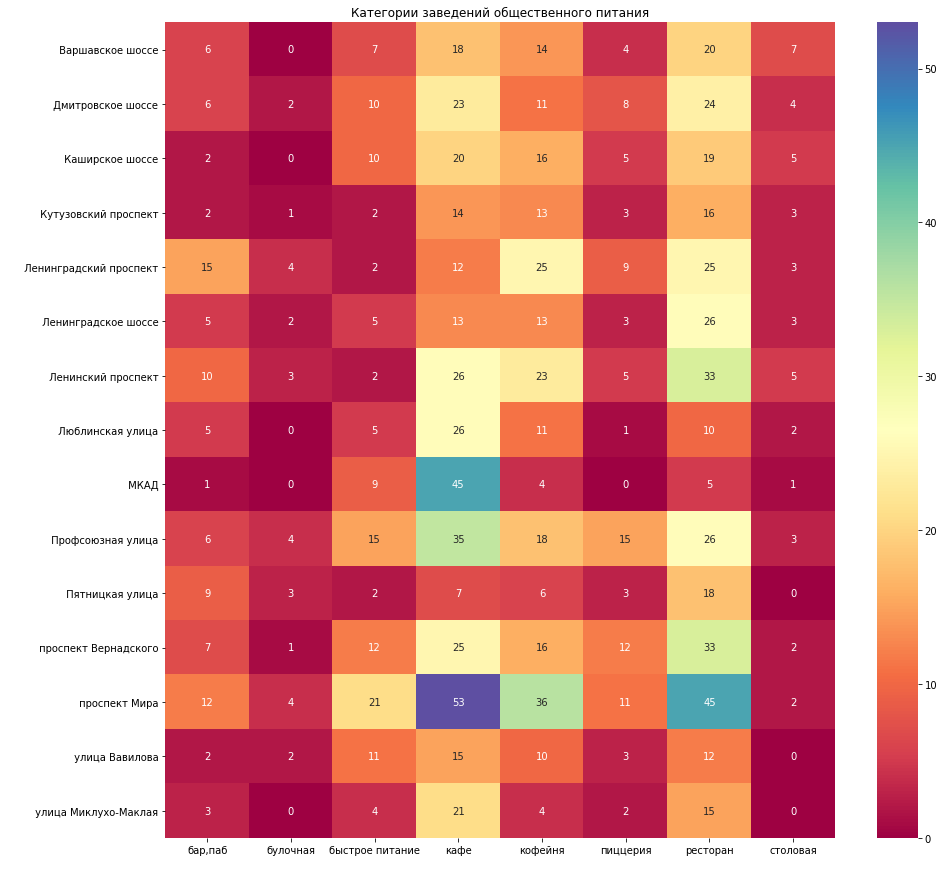

In [66]:
#визуализация Распределения категорий заведений общественного питания по топ-15 улиц г. Москва
plt.figure(figsize = (15,15))
sns.heatmap(category_by_street, cmap="BrBG", annot= True, fmt='g');
# подписи осей
plt.xlabel(' ')
plt.ylabel(' ')
plt.title('Категории заведений общественного питания');

<b>Вывод:</b>
* проспект Мира: кафе (53 ед.), ресторан (45 ед.), кофейня (36 ед.)
* в целом больше всего на улицах из списка топ-15 расположено ресторанов, затем кафе, далее кофейни
* на МКАДе резко кол-во расположенных кафе значительно больше, чем всех других заведений общественного питания. Это можно объяснить тем, что категория "кафе" максимально общая (туда можно отнести все, что угодно)

#### Улицы, где расположен только 1 объект заведений общественного питания

In [67]:
#создадим промежуточный датасет
df_street_names_count = df[['street', 'name']].groupby('street').count()
# отфильтруем записи, где расположено 1 заведение общественного питания
df_one_name = df_street_names_count[df_street_names_count['name'] == 1]

In [68]:
# создадим список
df_one_name = df_one_name.index
display(df_one_name)

Index([' 1-й Автозаводский проезд', ' 1-й Балтийский переулок',
       ' 1-й Варшавский проезд', ' 1-й Вешняковский проезд',
       ' 1-й Голутвинский переулок', ' 1-й Грайвороновский проезд',
       ' 1-й Дербеневский переулок', ' 1-й Земельный переулок',
       ' 1-й Капотнинский проезд', ' 1-й Кирпичный переулок',
       ...
       ' улица Уткина', ' улица Фадеева', ' улица Фотиевой', ' улица Чечулина',
       ' улица Чистова', ' улица Шкулева', ' улица Шкулева 4', ' улица Шухова',
       ' улица Юннатов', ' № 7'],
      dtype='object', name='street', length=458)

In [69]:
#создадим промежуточный датасет с группировкой по округам и типам заведений общественного питания
#на улицах с 1 типом заведения общественного питания
df_streets_1_name = pd.pivot_table(df.loc[df['street'].isin(df_one_name)],
                values=['name'],
                index=['district'],
                columns=['category'],
                aggfunc='count')['name']
df_streets_1_name = (df_streets_1_name).fillna(0)
display(df_streets_1_name)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,2.000,0.000,7.000,18.000,7.000,6.000,7.000,5.000
Западный административный округ,4.000,2.000,3.000,13.000,2.000,2.000,8.000,1.000
Северный административный округ,2.000,2.000,1.000,20.000,13.000,1.000,7.000,6.000
Северо-Восточный административный округ,2.000,0.000,3.000,16.000,10.000,3.000,14.000,7.000
Северо-Западный административный округ,1.000,0.000,1.000,4.000,3.000,0.000,8.000,2.000
Центральный административный округ,23.000,2.000,3.000,38.000,34.000,2.000,36.000,7.000
Юго-Восточный административный округ,5.000,0.000,1.000,20.000,6.000,1.000,4.000,2.000
Юго-Западный административный округ,0.000,1.000,2.000,9.000,4.000,0.000,1.000,1.000
Южный административный округ,0.000,1.000,2.000,22.000,5.000,0.000,8.000,5.000


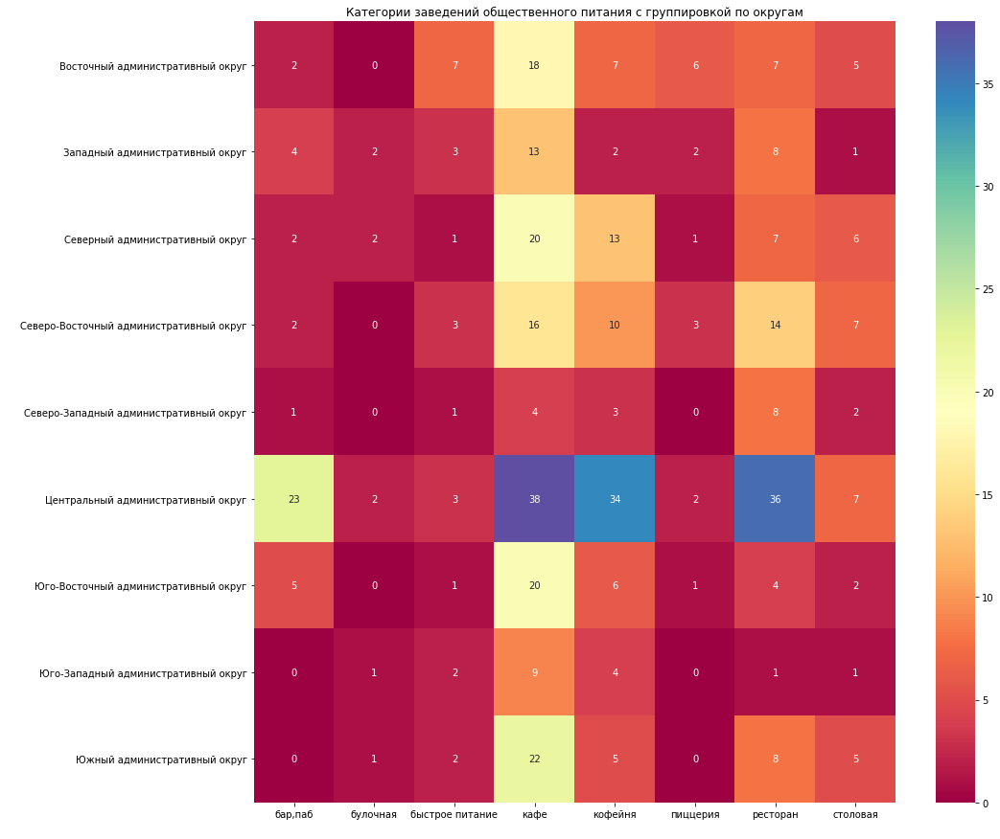

In [70]:
#визуализация 
plt.figure(figsize = (15,15))
sns.heatmap(df_streets_1_name, cmap="BrBG", annot= True, fmt='g');
# подписи осей
plt.xlabel(' ')
plt.ylabel(' ')
plt.title('Категории заведений общественного питания с группировкой по округам');

<b>Вывод: </b> больше всего "кафе" (под данную категорию попадают заведения разного ценового сегмента) и ресторанов; по общему количеству также лидирует центральный АО; меньше всего заведений в ЮЗАО и СЗАО.

In [71]:
#сводная табл для изучения распределения посадочных мест по категориям объектов общественного питания и рейтинга
pd.pivot_table(df,
           index=['category'],
           values=['seats', 'rating'])

,rating,seats
category,,
"бар,паб",4.388,76.184
булочная,4.268,51.676
быстрое питание,4.050,57.235
кафе,4.124,49.945
кофейня,4.277,59.102
пиццерия,4.301,63.744
ресторан,4.290,75.805
столовая,4.211,51.933


<b>Выводы: </b>
* в среднем во всех представленных типах заведений общественного питания более 40 посадочных мест;
* самый высокий рейтинг (в среднем) у баров, далее пиццерии, ресторан, кофейня;

#### Значения средних чеков 

In [72]:
# посчитаем медианное значение среднего чека по округам, создадим вспомогательный датасет
middle_avg_bill_df = df.loc[df['middle_avg_bill'] !=0]
x = middle_avg_bill_df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
display(x)

,district,middle_avg_bill
0,Восточный административный округ,575.000
1,Западный административный округ,1000.000
2,Северный административный округ,650.000
3,Северо-Восточный административный округ,500.000
4,Северо-Западный административный округ,700.000
5,Центральный административный округ,1000.000
6,Юго-Восточный административный округ,450.000
7,Юго-Западный административный округ,600.000
8,Южный административный округ,500.000


In [73]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=x,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение "среднего чека" по административным округам г. Москвы',
).add_to(m)

# выводим карту
m

<b>Вывод:</b>
самый дорогой "средний чек" в ЗАО и ЦАО, далее СЗАО, ЮЗАО.
Вероятное объяснение - ЗАО традиционно считается одним из самых престижных округов для проживания.

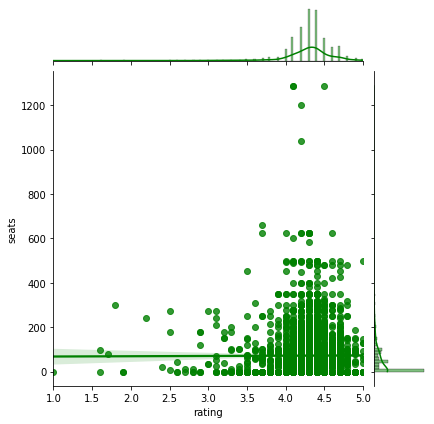

In [74]:
#посмотрим взаимосвязь кол-ва мест и рейтинга кофеен а датасете middle_avg_bill_df
sns.jointplot(x='rating', y='seats', data=middle_avg_bill_df, kind='reg', color = 'green');

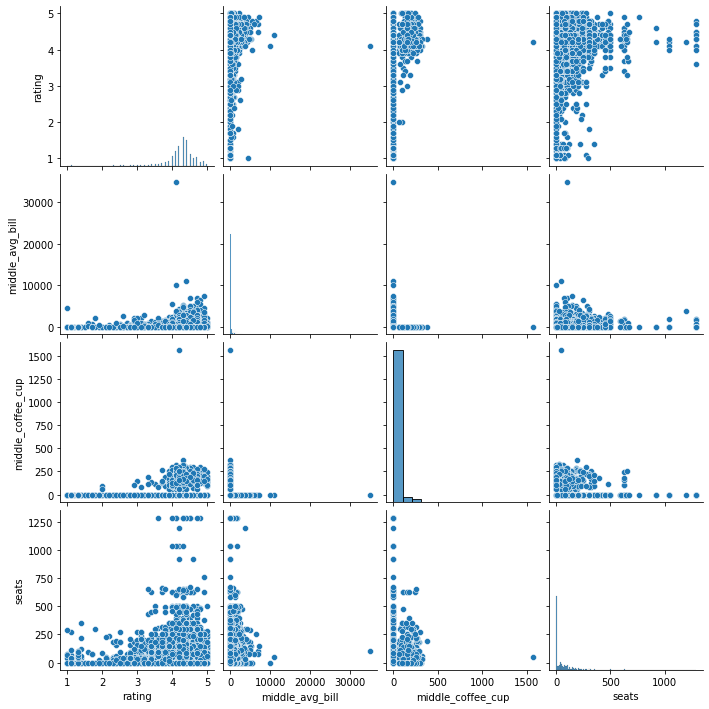

In [75]:
#посмотреть взаимосвязь признаков (матрицу диаграмм рассеяния)
cols = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
sns_plot = sns.pairplot(df[cols]);

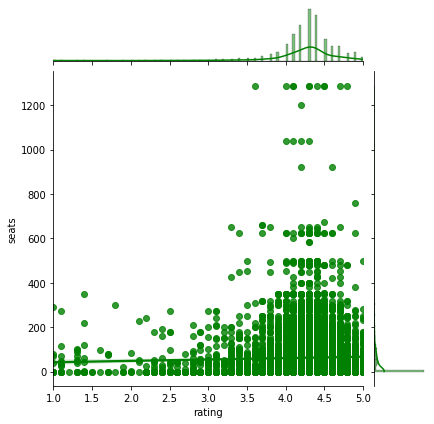

In [76]:
sns.jointplot(x='rating', y='seats', data=df, kind='reg', color = 'green');

<div style="border:solid green 2px; padding: 20px">
<b>Общие выводы по датасету: </b>
    
В представленном датасете указана информация о заведениях общественного питания (далее - "Заведения ОП")г. Москва.
В ходе исследования было осуществлено:

    1) общее изучение данных:
    * устранены тех.ошибки в датасете (опечатки е/ё, лишние/случайные пробелы, аномально высокие значения);
    * больше всего Заведения ОП расположено в центральном округе;
    * наиболее распростаненный временой интервал с 10:00 до 22:00; превалирующеее большинство работает ежедневно
    2) была заменены отсутствующие значения по сети Заведения ОП;
    3) в датасете представлены 8 категорий заведений общественного питания; чаще всего открывают "Кафе" (2 378 ед), "рестораны" (2 043 ед), "кофейни" (1 413 ед);
    4) в датасете представлены Заведения ОП расположенные как в целом по Москве, так и на территории ТРЦ и разного рода фудкортов и рынков; Есть данные по след. административным районам Москвы: 
    * Центральный административный округ (2242 ед.)
    * Северный административный округ (900 ед.)
    * Южный административный округ (892 ед.)
    * Северо-Восточный административный округ (891 ед.)
    * Западный административный округ (851 ед.)
    * Восточный административный округ (798 ед.)
    * Юго-Восточный административный округ (714 ед.)
    * Юго-Западный административный округ (709 ед.)
    * Северо-Западный административный округ (409 ед.) - заметно значительное сокращение кол-ва заведений ОП, требуется доп.исследование для понимания причин.
    5) в среднем во всех представленных типах заведений общественного питания более 40 посадочных мест; 
    6) самый высокий рейтинг (в среднем) у баров, далее пиццерии, ресторан, кофейня;
    7) в датасете представлено больше несетевых заведений;
    8) определены топ-15 сетевых заведений (все они относятся к среднему ценовому сегменту);
    9) самые рейтинговые заведения расположены в центральном округе; средние рейтинги заведений сильно не различаются. При этом самый дорогой "средний чек" в ЗАО, далее ВАО, СЗАО, ЦАО;

<div style="border:solid green 2px; padding: 20px">
<b>Общий вывод по наблюдениям: </b>
    
* в датасете представлено 8 категорий заведений общественного питания; чаще всего открывают "Кафе" (2 378 ед), "рестораны" (2 043 ед), "кофейни" (1 413 ед);
* в среднем во всех представленных типах заведений общественного питания более 40 посадочных мест;
* самый высокий рейтинг (в среднем) у баров, далее идут пиццерии, ресторан, кофейня;
В датасете представлены также ТРЦ, где расположено большое кол-во точек общественного питания, вероятно кол-во посадочных мест указано суммарно, на всю зону фудкорта. В этом случае эти данные, вероятно, не следует брать в расчет, либо следует рассматривать отдельно, так как цели "открытие заведения общественного питания на территории ТРЦ" и "открытие заведения общественного питания на территории Москвы в общем" несколько различаются (разная аудитория, затраты на вложение, накладные расходы;
Всего в датасете 8406 записи, при это заведений с кол-вом посадочных мест менее 150 мест - 7274. То есть % записей с информацией о заведениях общественного питания на территории ТРЦ порядка 13,5 %;
* В датасете представлено больше несетевых заведений, а все указанные сетевые заведения известны и реальны; данные сети не являются ресторанами, скорее относятся с среднему ценовому сегменту (часть из них вообще предполагает возможность купить кофе и еду "навынос": One Price Coffe, Cofix, Додо Пицца, Prime). Они относятся к совершенно разным категориям: кофейня, булочная, ресторан, быстрое питание, кафе, пиццерия, столовая, бар/паб; 
* Самые популярные сети: Шоколадница, Домино'c пицца, Додо пицца;
* В центральном округе больше всего ресторанов (670 шт) и кафе (464 шт). Кафе во всех регионах лежат в дианопозе от 200 до 500. Также можно заметить, что больше всего пабов именно в центральном районе. Самые рейтинговые заведения расположены в центральном округе, при этом средние рейтинги заведений сильно не различаются, самые высокие рейтинги у баров/пабов;
* Самое большое количество заведений общественного питания расположено на ул. Проспект Мира (184 ед), при этом разница значительная со 2м "лидером": 62 ед или 33,7%;
* проспект Мира: кафе (53 ед.), ресторан (45 ед.), кофейня (36 ед.);
* в целом больше всего на улицах из списка топ-15 расположено ресторанов, затем кафе, далее кофейни;
* на МКАДе кол-во расположенных кафе значительно больше, чем всех других заведений общественного питания. Это можно объяснить тем, что категория "кафе" максимально общая (туда можно отнести все, что угодно);


#### Детализируем исследование: открытие кофейни

In [77]:
# создадим отдельный датасет с  кофейнями, учтем, что так как инвесторы хотят кофейню как в сериале "Друзья", значит данные по 
# кофейням в ТРЦ не показательны
coffee_df = df[(df['category'] == 'кофейня') & (df['seats'] < 150)].reset_index()
print('Всего в Москве', coffee_df.shape[0], 'кофеен')

Всего в Москве 1230 кофеен


In [78]:
#визуализация рпспределения кофеее по районам
#создадим вспомогательный датасет
df_coffee = coffee_df['district'].value_counts()
fig = px.bar(df_coffee, # загружаем данные
             x = df_coffee.values, # указываем столбец с данными для оси X
             y = df_coffee.index, # указываем столбец с данными для оси Y
             text = df_coffee.values # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение кофеен по администартивным округа г. Москвы',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Административный округ')
fig.show() # выводим график

<b>Вывод: </b> Больше всего кофеен в центре. В остальных административных округах их количество варьируется от 60 до 120 заведений.

In [79]:
#поймем кол-во круглосуточных кофеен
(coffee_df['is_24/7'] =='True').sum()

51

<b>Вывод: </b> Всего в датасете 59 кофеен с круглосуточным режимом работы

In [80]:
#поймем как распределены круглосуточные кофейни по округам
coffee_df['is_24/7'] = coffee_df['is_24/7'] == 'True'
coffee_df.groupby('district')['is_24/7'].sum()

district
Восточный административный округ            5
Западный административный округ             9
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      1
Центральный административный округ         19
Юго-Восточный административный округ        1
Юго-Западный административный округ         7
Южный административный округ                1
Name: is_24/7, dtype: int64

<b>Вывод: </b>
большинство круглосуточных кофеен в ЦАО (19 ед), далее идут ЗАО (9 ед) и ЮЗАО (7 ед)

In [81]:
#сгруппируем кофейни по округам и посмотрим усредненный рейтинг 
coffee_df.groupby('district', as_index=False)['rating'].agg('median')

,district,rating
0,Восточный административный округ,4.300
1,Западный административный округ,4.300
2,Северный административный округ,4.300
3,Северо-Восточный административный округ,4.300
4,Северо-Западный административный округ,4.300
5,Центральный административный округ,4.300
6,Юго-Восточный административный округ,4.300
7,Юго-Западный административный округ,4.300
8,Южный административный округ,4.300


In [82]:
# визуализация распределения рейтинга по округам
# создадим вспомогательный датасет
a = coffee_df.groupby('district', as_index=False)['rating'].agg('median')
fig = px.bar(a, # загружаем данные
             x = a['rating'], # указываем столбец с данными для оси X
             y = a['district'], # указываем столбец с данными для оси Y
             text = a['rating'] # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение кофеен по администартивным округа г. Москвы',
                   xaxis_title='Усредненный рейтинг',
                   yaxis_title='Административный округ')
fig.show() # выводим график

<b>Вывод: </b>
В целом рейтинг кафеен одинаковый, только в ЗАО рейтинг ниже на 0,1 ед. Что, в целом, незначительно и вряд ли требует доп.исследования.

In [83]:
# определим медианную стоимость 1 чашки капучино - на эти цены нужно ориентироваться при открытии кофейни
df.loc[df['middle_coffee_cup'] !=0].groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

,district,middle_coffee_cup
0,Восточный административный округ,135.000
1,Западный административный округ,187.000
2,Северный административный округ,159.000
3,Северо-Восточный административный округ,162.500
4,Северо-Западный административный округ,150.000
5,Центральный административный округ,190.000
6,Юго-Восточный административный округ,145.000
7,Юго-Западный административный округ,197.000
8,Южный административный округ,149.500


In [84]:
# визуализация распределения медианной стоимости одной чашки капучино по округам г. Москвы
# создадим вспомогательный датасет
one_cup_coffe = df.loc[df['middle_coffee_cup'] !=0].groupby('district', as_index=False)['middle_coffee_cup'].agg('median').\
sort_values(by = 'middle_coffee_cup', ascending = False)
fig = px.bar(a, # загружаем данные
             x = one_cup_coffe['middle_coffee_cup'], # указываем столбец с данными для оси X
             y = one_cup_coffe['district'], # указываем столбец с данными для оси Y
             text = one_cup_coffe['middle_coffee_cup'] # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение медианной стоимости одной чашки капучино по округам г. Москвы',
                   xaxis_title='Медианное значение стоимости одной чашки капучино по округам г. Москвы (Руб.)',
                   yaxis_title='Административный округ')
fig.show() # выводим график

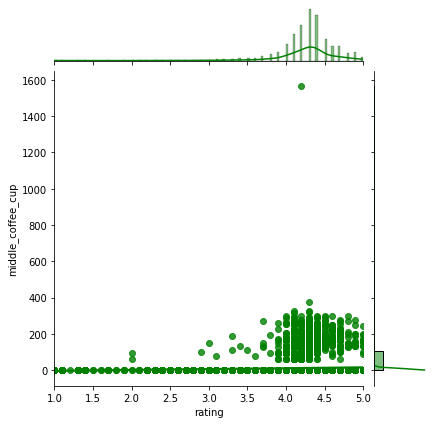

In [85]:
# посмотрим взаимосвязь рейтинга и стоимости чашки капучино
sns.jointplot(x='rating', y='middle_coffee_cup', data=df, kind='reg', color = 'green');

<b>Вывод: </b> не выявлено сильной какой-то сильно/значимой взаимосвязи между стоимостью средней чашки капучино и рейтингом. Оценка посетителями той или иной кофейни определяется не только прайсом заведения.

<div style="border:solid green 2px; padding: 20px">
<b>Выводы по разделу: Детализируем исследование: открытие кофейни</b>
    
* Больше всего кофеен в центре. В остальных административных округах их количество варьируется от 60 до 120 заведений;
* Без учета ТРЦ в датасете 51 кофейня с круглосуточным режимом работы (большинство круглосуточных кофеен в ЦАО (19 ед), далее идут ЗАО (9 ед) и ЮЗАО (7 ед));
* В целом рейтинг кафеен одинаковый;
* установлено, что ЮЗАО является лидером по медианной стоимости 1 чашки капучино, при этом лидером по медианной стоимости среднего чека явл. ЗАО, а ЮЗАО не попадает дв топ-3 по цене. При этом стоимость средней чашки капучино определеяется данными из колонки со средним чеком. Рекомедуется доп.исследование/проверка.

<div style="border:solid green 2px; padding: 20px">
<b>Рекомендации для открытия нового заведения:</b>
    
1) Стоимость стандартной чашки капучино лучше держать в диапазоне от 150 до 170 рублей (такая цена будет в среднем ценовом диапазоне);
    
2) Количество посадочных мест: 35-60 (так как цель: открытие кофейни аналогичной Центральной кофейне в сериале "Друзья");
    
3) Рекомендуемый режим работы с 10 до 22х часов (круглосуточных кофеен не так много, а кофейни с посадочными местами скорее для дневного и вечернего досуга);
    
4) Локация: при поиске помещения для аренды лучше смотреть адреса недалеко от границ ЦАО (в пределах третьего-транспортного кольца, лучше всего на территории ЗАО, ЮЗАО, СЗА)

Ссылка на презентацию: 

https://drive.google.com/file/d/1ukuxxyccaxnE2D1-qYSqxI6ng0DqvcS4/view?usp=sharing